# Segmenting and Clustering Neighborhoods in Calgary

### Part 1: The code below will be used to scrape the Wikipedia page and generate the requested Panadas Dataframe

In [2]:

import pandas as pd

!pip install geopy
!pip install geocoder
import geocoder # import geocoder

In [3]:
# Matplotlib and associated plotting modules
!pip install matplotlib
import matplotlib.cm as cm
import matplotlib.colors as colors

!pip -q install folium
import folium # map rendering library
!pip install lxml
print('Libraries imported.')

Libraries imported.


In [4]:
!pip install geopy
from geopy.geocoders import Nominatim

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

! pip install numpy
import numpy as np

### The code below will be used to pull and clean the Calgary census information

In [5]:
# Using Pands read_html() method to read the table containing census information from wiki webpage

url='https://en.wikipedia.org/wiki/List_of_neighbourhoods_in_Calgary#cite_note-opendatacommunities-11'

df1=pd.read_html(url)[0]
df1=df1.drop(['Ward[12]', '2012 PopulationRank','Population(2011)[10]', '% change', 'Dwellings(2012)[10]'], axis=1)
df1=df1.rename(columns={"Name[10]": "Neighborhood", "Sector[11]": "Sector", "Type[11]":"Type",\
                      "Population(2012)[10]":"Population (2012)", "Area(km2)[11]":"Area (km^2)", "Populationdensity": "Population Density (Pop/km^2)" })

df1

,Neighborhood,Quadrant,Sector,Type,Population (2012),Area (km^2),Population Density (Pop/km^2)
0,Abbeydale,NE/SE,Northeast,Residential,5917.0,1.7,3480.6
1,Acadia,SE,South,Residential,10705.0,3.9,2744.9
2,Albert Park/Radisson Heights,SE,East,Residential,6234.0,2.5,2493.6
3,Altadore,SW,Centre,Residential,9116.0,2.9,3143.4
4,Alyth/Bonnybrook,SE,Centre,Industrial,16.0,3.8,4.2
...,...,...,...,...,...,...,...
253,Windsor Park,SW,Centre,Residential,4126.0,1.3,3173.8
254,Winston Heights/Mountview,NE,Centre,Residential,3891.0,3.0,1297
255,Woodbine,SW,South,Residential,9131.0,3.2,2853.4
256,Woodlands,SW,South,Residential,6201.0,2.8,2214.6


In [6]:
# Dropping Last row 

df1.drop(index=257,inplace=True)
df1

,Neighborhood,Quadrant,Sector,Type,Population (2012),Area (km^2),Population Density (Pop/km^2)
0,Abbeydale,NE/SE,Northeast,Residential,5917.0,1.7,3480.6
1,Acadia,SE,South,Residential,10705.0,3.9,2744.9
2,Albert Park/Radisson Heights,SE,East,Residential,6234.0,2.5,2493.6
3,Altadore,SW,Centre,Residential,9116.0,2.9,3143.4
4,Alyth/Bonnybrook,SE,Centre,Industrial,16.0,3.8,4.2
...,...,...,...,...,...,...,...
252,Willow Park,SE,South,Residential,5229.0,3.4,1537.9
253,Windsor Park,SW,Centre,Residential,4126.0,1.3,3173.8
254,Winston Heights/Mountview,NE,Centre,Residential,3891.0,3.0,1297
255,Woodbine,SW,South,Residential,9131.0,3.2,2853.4


### Try to scrape the above table & get location data !!!!

In [8]:
# Stripping possible spaces from data, edited 
df1.Neighborhood = df1.Neighborhood.str.strip()


Lat=[]
Lon=[]
Neighbor=[]
for i in range(0,len(df1)):
    address ='{}, Calgary City, AB'.format(df1['Neighborhood'][i])
    geolocator = Nominatim(user_agent="calgary_explorer")
    try:
        location = geolocator.geocode(address)
        Lat.append(location.latitude)
        Lon.append(location.longitude)
        Neighbor.append(df1['Neighborhood'][i])
        print(df1['Neighborhood'][i], location.latitude, location.longitude)
    except:
        print('***Unable to obtain coordinates')
        print(df1['Neighborhood'][i], 0, 0)
        Lat.append(np.nan)
        Lon.append(np.nan)
        Neighbor.append(df1['Neighborhood'][i])

        

Abbeydale 51.0588364 -113.9294129
Acadia 50.9686551 -114.0555871
Albert Park/Radisson Heights 51.044845 -113.9901949
Altadore 51.0151043 -114.1007564
Alyth/Bonnybrook 51.0166688 -114.024294
Applewood Park 51.0446578 -113.9289305
Arbour Lake 51.1367865 -114.2023554
Aspen Woods 51.0431192 -114.2101852
Auburn Bay 50.8906047 -113.9595647
Aurora Business Park 51.1405494 -114.0627072
Banff Trail 51.0714621 -114.1116473
Bankview 51.0338869 -114.0995178
Bayview 50.9735771 -114.1125609
Beddington Heights 51.1285977 -114.0821988
Bel-Aire 50.9996931 -114.0868109
Beltline 51.0404978 -114.0725934
Bonavista Downs 50.9446559 -114.0305504
Bowness 51.0892766 -114.1930754
Braeside 50.9557843 -114.1068165
Brentwood 51.0930748 -114.1260514
Bridgeland/Riverside 51.0538013 -114.0443096
Bridlewood 50.9007131 -114.1105152
Britannia 51.0125403 -114.0834469
Burns Industrial 51.0010615 -114.037984
Calgary International Airport 51.120751 -114.01057234296194
Cambrian Heights 51.0871956 -114.088976
Canada Olympic P

Somerset 50.8987423 -114.0833678
South Airways 51.0776821 -114.0141162
South Calgary 51.0261348 -114.1019068
South Foothills 50.9720473 -113.9712264
Southview 51.0338919 -113.9946974
Southwood 50.9572479 -114.0838187
Springbank Hill 51.0289259 -114.2097933
Spruce Cliff 51.0497063 -114.1386332
St. Andrews Heights 51.0637561 -114.1246327
Starfield 50.9982367 -113.9395978
Stonegate Landing 51.1635206 -113.9850422
***Unable to obtain coordinates
Stoney 1 0 0
***Unable to obtain coordinates
Stoney 2 0 0
***Unable to obtain coordinates
Stoney 3 0 0
Stoney 4 51.1798808 -113.9844416
Strathcona Park 51.0478678 -114.1844789
Sunalta 51.04293955 -114.10141300381927
Sundance 50.8977765 -114.0427229
Sunnyside 51.0578696 -114.0787405
Sunridge 51.0750045 -113.9914787
Taradale 51.1167042 -113.9384638
Temple 51.0884242 -113.9478774
Thorncliffe 51.1060956 -114.069411
Tuscany 51.1253802 -114.2448425
Tuxedo Park 51.0737885 -114.0613483
University Heights 51.0707401 -114.1372308
University of Calgary 51.074

In [9]:
df1['Latitude']=Lat
df1['Longitude']=Lon
df1['Neigh']=Neighbor


df1


,Neighborhood,Quadrant,Sector,Type,Population (2012),Area (km^2),Population Density (Pop/km^2),Latitude,Longitude,Neigh
0,Abbeydale,NE/SE,Northeast,Residential,5917.0,1.7,3480.6,51.058836,-113.929413,Abbeydale
1,Acadia,SE,South,Residential,10705.0,3.9,2744.9,50.968655,-114.055587,Acadia
2,Albert Park/Radisson Heights,SE,East,Residential,6234.0,2.5,2493.6,51.044845,-113.990195,Albert Park/Radisson Heights
3,Altadore,SW,Centre,Residential,9116.0,2.9,3143.4,51.015104,-114.100756,Altadore
4,Alyth/Bonnybrook,SE,Centre,Industrial,16.0,3.8,4.2,51.016669,-114.024294,Alyth/Bonnybrook
...,...,...,...,...,...,...,...,...,...,...
252,Willow Park,SE,South,Residential,5229.0,3.4,1537.9,50.960293,-114.054645,Willow Park
253,Windsor Park,SW,Centre,Residential,4126.0,1.3,3173.8,51.006165,-114.076187,Windsor Park
254,Winston Heights/Mountview,NE,Centre,Residential,3891.0,3.0,1297,51.072303,-114.047588,Winston Heights/Mountview
255,Woodbine,SW,South,Residential,9131.0,3.2,2853.4,50.942554,-114.128853,Woodbine


In [10]:
# remove columns to simplify the dataframe
df3=df1.drop(['Neigh'], axis=1)
df3

#remove all the 0 values for latitude and longitude 
df4=df3.dropna()
df4

,Neighborhood,Quadrant,Sector,Type,Population (2012),Area (km^2),Population Density (Pop/km^2),Latitude,Longitude
0,Abbeydale,NE/SE,Northeast,Residential,5917.0,1.7,3480.6,51.058836,-113.929413
1,Acadia,SE,South,Residential,10705.0,3.9,2744.9,50.968655,-114.055587
2,Albert Park/Radisson Heights,SE,East,Residential,6234.0,2.5,2493.6,51.044845,-113.990195
3,Altadore,SW,Centre,Residential,9116.0,2.9,3143.4,51.015104,-114.100756
4,Alyth/Bonnybrook,SE,Centre,Industrial,16.0,3.8,4.2,51.016669,-114.024294
...,...,...,...,...,...,...,...,...,...
252,Willow Park,SE,South,Residential,5229.0,3.4,1537.9,50.960293,-114.054645
253,Windsor Park,SW,Centre,Residential,4126.0,1.3,3173.8,51.006165,-114.076187
254,Winston Heights/Mountview,NE,Centre,Residential,3891.0,3.0,1297,51.072303,-114.047588
255,Woodbine,SW,South,Residential,9131.0,3.2,2853.4,50.942554,-114.128853


In [11]:
df4['Population Density (Pop/km^2)']=df4['Population (2012)']/df4['Area (km^2)']
df4

c:\users\hz\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Neighborhood,Quadrant,Sector,Type,Population (2012),Area (km^2),Population Density (Pop/km^2),Latitude,Longitude
0,Abbeydale,NE/SE,Northeast,Residential,5917.0,1.7,3480.588235,51.058836,-113.929413
1,Acadia,SE,South,Residential,10705.0,3.9,2744.871795,50.968655,-114.055587
2,Albert Park/Radisson Heights,SE,East,Residential,6234.0,2.5,2493.600000,51.044845,-113.990195
3,Altadore,SW,Centre,Residential,9116.0,2.9,3143.448276,51.015104,-114.100756
4,Alyth/Bonnybrook,SE,Centre,Industrial,16.0,3.8,4.210526,51.016669,-114.024294
...,...,...,...,...,...,...,...,...,...
252,Willow Park,SE,South,Residential,5229.0,3.4,1537.941176,50.960293,-114.054645
253,Windsor Park,SW,Centre,Residential,4126.0,1.3,3173.846154,51.006165,-114.076187
254,Winston Heights/Mountview,NE,Centre,Residential,3891.0,3.0,1297.000000,51.072303,-114.047588
255,Woodbine,SW,South,Residential,9131.0,3.2,2853.437500,50.942554,-114.128853


In [12]:
df4.to_csv(r'C:\Users\HZ\Desktop\Data Science\Coursera_Capstone\Calgary_census_location1.csv')

## Part 3: The code below will be used to explore the neighborhoods in Calgary

### First Plot the Neighborhoods obtained on a Map of Calgary 

In [13]:
# Getting the geographical coordinates of Calgary

address = 'Calgary, AB'

geolocator = Nominatim(user_agent="Cal_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Calgary City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Calgary City are 51.0534234, -114.0625892.


In [14]:
# Using Folium to the map of calgary show all the neighbourhood coordinates

calgary_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# loop through the df and add each to the map
for lat, lng, label in zip(df4.Latitude, df4.Longitude, df4.Neighborhood):
    folium.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='blue',
        fill=True,
        popup=label,
        fill_color='blue',
        fill_opacity=0.4
    ).add_to(calgary_map)

# show map
calgary_map


In [338]:
# Displaying Choropleth map for population density in calgary + neighbourhood markers
calgary_geo = r'D:\2.neighborhoods-master\neighborhoods-master\calgary.geojson'

# The Map class normally creates a TileLayer object with some default settings. You can disable that by setting tiles=None.
# m = folium.Map((0, 0), tiles=None)
# folium.TileLayer('cartodbpositron', name='my tilelayer').add_to(m)

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(df4['Population Density (Pop/km^2)'].min(),
                              df4['Population Density (Pop/km^2)'].max(), 6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.

calgary_geo_map = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='Mapbox Bright')
folium.TileLayer('cartodbpositron').add_to(calgary_geo_map)
folium.Choropleth(
    geo_data=calgary_geo,
    data=df4,
    columns=['Neighborhood', 'Population Density (Pop/km^2)'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population Density (Pop/km^2)',
    reset=True
).add_to(calgary_geo_map)
calgary_geo_map


In [16]:
# Testing to add neighbourhood dots on Calgary_geo_map

# loop through the df and add each to the map
for lat, lng, label in zip(df4.Latitude, df4.Longitude, df4.Neighborhood):
    folium.CircleMarker(
        [lat, lng],
        radius=3, # define how big you want the circle markers to be
        color='light blue',
        fill=True,
        popup=label,
        fill_color='blue',
        fill_opacity=0.4
    ).add_to(calgary_geo_map)

# show map
calgary_geo_map


### Using Foursquare to obtain Venue data for Calgary Neighborhoods

In [17]:
# @hidden_cell
# Defining Credentials for Foursquare

CLIENT_ID = 'IEBRFVWPTAYMKDNRHEVEWUXL34RM5CYE5Y2QPPQXHXVMOD40' # your Foursquare ID
CLIENT_SECRET = 'IBDCKQLBB0LY2UIX02UQ440V5JSKWCNEC4IOUF1ZYLKJZA4B' # your Foursquare Secret
VERSION = '20201115' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:


### Part 3: The code below will be used to explore and cluster the neighborhoods in Calgary

***3.1 The code below will be used to Explore the Neighbourhood Venues in Calgary***

In [18]:
# User defined function to extract and process all neighbourhoods venues in calgary

def getNearbyVenues(names, latitudes, longitudes, radius=1500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['id'],
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])    
    
    # The code below contains two for loops:the first loop iterates over venues_list and gives row wise value at each iteration in terms of value_list
    # second for loop which is inside this loop iterates over values in value_list which we get from the above for loop and gives the value in the list.
    # It can be written as:        for venue_list in venue_list:
                                        # for item in venue_list:
                                            # item
            
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue Id',
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [19]:
# Running the user defined function and pulling all relevant venues 

calgary_venues=getNearbyVenues(names=df4['Neighborhood'], latitudes=df4['Latitude'], longitudes=df4['Longitude'])

Abbeydale
Acadia
Albert Park/Radisson Heights
Altadore
Alyth/Bonnybrook
Applewood Park
Arbour Lake
Aspen Woods
Auburn Bay
Aurora Business Park
Banff Trail
Bankview
Bayview
Beddington Heights
Bel-Aire
Beltline
Bonavista Downs
Bowness
Braeside
Brentwood
Bridgeland/Riverside
Bridlewood
Britannia
Burns Industrial
Calgary International Airport
Cambrian Heights
Canada Olympic Park
Canyon Meadows
Capitol Hill
Castleridge
Cedarbrae
Chaparral
Charleswood
Chinatown
Chinook Park
Christie Park
Citadel
Cliff Bungalow
Coach Hill
Collingwood
Copperfield
Coral Springs
Cougar Ridge
Country Hills
Country Hills Village
Coventry Hills
Cranston
Crescent Heights
Crestmont
Dalhousie
Deer Ridge
Deer Run
Diamond Cove
Discovery Ridge
Dover
Downtown Commercial Core
Downtown East Village
Downtown West End
Eagle Ridge
East Fairview Industrial
East Shepard Industrial
Eastfield
Eau Claire
Edgemont
Elbow Park
Elboya
Erin Woods
Erlton
Evanston
Evergreen
Fairview
Fairview Industrial
Falconridge
Foothills
Forest Heights

In [20]:
# Checking the size of resulting dataframe

print(calgary_venues.shape)
calgary_venues.head()

(9455, 8)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbeydale,51.058836,-113.929413,4b875375f964a52092bb31e3,Atlas Pizza and Sports Bar,51.052481,-113.941859,Pizza Place
1,Abbeydale,51.058836,-113.929413,4c60a22bcd522d7f36bcce3f,A&W,51.068291,-113.933571,Fast Food Restaurant
2,Abbeydale,51.058836,-113.929413,4fad705de4b068aefdbf12b6,Subway,51.059239,-113.934423,Sandwich Place
3,Abbeydale,51.058836,-113.929413,4b770f11f964a520f9782ee3,Calgary Co-op,51.068719,-113.934014,Grocery Store
4,Abbeydale,51.058836,-113.929413,4da8d0a8a86e771ea6fca74b,Subway,51.069623,-113.932907,Sandwich Place


### Analyzing the Venues Results List Returned

In [21]:
# Checking the summary statistics of the dataframe

calgary_venues[['Neighborhood','Venue','Venue Category']].describe(include='all')

,Neighborhood,Venue,Venue Category
count,9455,9455,9455
unique,230,2167,299
top,Kingsland,Tim Hortons,Coffee Shop
freq,100,244,685


In [22]:
# Create a list of Unique Venues

calgary_venues['Venue Category'].unique()

array(['Pizza Place', 'Fast Food Restaurant', 'Sandwich Place',
       'Grocery Store', 'Gas Station', 'Convenience Store',
       'Ice Cream Shop', 'Filipino Restaurant', 'Café', 'Vineyard',
       'Park', 'Chinese Restaurant', 'Vietnamese Restaurant',
       'Discount Store', 'Italian Restaurant', 'Liquor Store',
       'Gym / Fitness Center', 'Yoga Studio', 'Mexican Restaurant', 'Bar',
       'Pub', 'Clothing Store', 'Candy Store', 'Nightclub',
       'Recreation Center', 'Coffee Shop', 'Electronics Store',
       'American Restaurant', 'Hotel', 'Pharmacy', 'Bookstore',
       'Sushi Restaurant', 'Bank', 'Arts & Crafts Store', 'Wings Joint',
       'Breakfast Spot', 'Seafood Restaurant', 'Sports Bar',
       'Toy / Game Store', 'Miscellaneous Shop', 'Diner',
       'Shop & Service', 'Auto Garage', 'Salon / Barbershop', 'Bakery',
       'Fried Chicken Joint', 'Golf Course', 'Costume Shop', 'Taco Place',
       'Thrift / Vintage Store', 'Furniture / Home Store', 'Flea Market',
       

In [26]:
# Checking to see all the coffee shops in Calgary

coffee_df=calgary_venues[calgary_venues['Venue Category'].str.contains("Coffee")]
coffee_df.reset_index(drop=True, inplace=True)
coffee_df

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Acadia,50.968655,-114.055587,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,Coffee Shop
1,Acadia,50.968655,-114.055587,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954,Coffee Shop
2,Acadia,50.968655,-114.055587,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409,Coffee Shop
3,Acadia,50.968655,-114.055587,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547,Coffee Shop
4,Acadia,50.968655,-114.055587,4b4667fef964a520eb1f26e3,Starbucks - Southland Crossing,50.966314,-114.072908,Coffee Shop
...,...,...,...,...,...,...,...,...
680,Woodbine,50.942554,-114.128853,4b62668ff964a5200d462ae3,Tim Hortons,50.953339,-114.117292,Coffee Shop
681,Woodbine,50.942554,-114.128853,4be976bbd837c9b6cb70a606,Tim Hortons,50.953651,-114.117483,Coffee Shop
682,Woodlands,50.942435,-114.109359,4eb2b83fe3008b29020837f8,Starbucks,50.940328,-114.119909,Coffee Shop
683,Woodlands,50.942435,-114.109359,4b62668ff964a5200d462ae3,Tim Hortons,50.953339,-114.117292,Coffee Shop


In [27]:
# Using only unique Ids 
coffee_df=coffee_df.drop_duplicates(subset=['Venue Id'])
coffee_df

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Acadia,50.968655,-114.055587,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,Coffee Shop
1,Acadia,50.968655,-114.055587,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954,Coffee Shop
2,Acadia,50.968655,-114.055587,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409,Coffee Shop
3,Acadia,50.968655,-114.055587,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547,Coffee Shop
4,Acadia,50.968655,-114.055587,4b4667fef964a520eb1f26e3,Starbucks - Southland Crossing,50.966314,-114.072908,Coffee Shop
...,...,...,...,...,...,...,...,...
585,Stonegate Landing,51.163521,-113.985042,59f78113002f4c24892a5bef,Tim Hortons,51.154765,-113.999833,Coffee Shop
609,Tuscany,51.125380,-114.244843,4b10345cf964a520456b23e3,Starbucks,51.124796,-114.248401,Coffee Shop
614,University Heights,51.070740,-114.137231,505cb630e4b0474d87f25d04,Starbucks,51.075199,-114.137260,Coffee Shop
636,Upper Mount Royal,51.029358,-114.086519,4dc800961f6ef43b8a524444,Good Earth Cafe,51.041408,-114.081741,Coffee Shop


In [28]:
# Checking to see the JSON format for the detailed information in FourSquare 

venue_id='5502fb8c498e95778d8e7fd5'
venue_url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
coffee_result = requests.get(venue_url).json()
coffee_result



{'meta': {'code': 200, 'requestId': '5fbdd4489663526c3ca42e2a'},
 'response': {'venue': {'id': '5502fb8c498e95778d8e7fd5',
   'name': 'Monogram Coffee',
   'contact': {'twitter': 'monogramco',
    'facebook': '351415101688966',
    'facebookUsername': 'monogramcoffee',
    'facebookName': 'Monogram Coffee'},
   'location': {'address': '4814 16 Street SW',
    'lat': 51.010967065214984,
    'lng': -114.10005439602287,
    'labeledLatLngs': [{'label': 'display',
      'lat': 51.010967065214984,
      'lng': -114.10005439602287}],
    'cc': 'CA',
    'city': 'Calgary',
    'state': 'AB',
    'country': 'Canada',
    'formattedAddress': ['4814 16 Street SW', 'Calgary AB', 'Canada']},
   'canonicalUrl': 'https://foursquare.com/v/monogram-coffee/5502fb8c498e95778d8e7fd5',
   'categories': [{'id': '4bf58dd8d48988d1e0931735',
     'name': 'Coffee Shop',
     'pluralName': 'Coffee Shops',
     'shortName': 'Coffee Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffe

In [29]:
# Using Foursquare to obtain detailed information for each coffee venue using the venue Id
# User defined function to loop through each venue and generate the required dataframe 

# User defined function to extract and process all neighbourhoods venues in calgary
  
def getVenuesRatings(venue_id, venue_name, venue_lat, venue_lon):
    
    venues_ratings_list=[]
    for vid, vname, vlat, vlon in zip(venue_id, venue_name, venue_lat, venue_lon):
        print(vid, vname)
            
        # create the API request URL
        url ='https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(vid, CLIENT_ID, CLIENT_SECRET, VERSION)    
        # make the GET request
        result = requests.get(url).json()
        venueid=vid
        name=result['response']['venue']['name']

        #name, likes, rating, photos, tips, price
        try:
            likes=result['response']['venue']['likes']['count']
        except:
            likes=np.nan
        try:
            rating=result['response']['venue']['rating']
        except:
            rating=np.nan
        try: 
            photos=result['response']['venue']['photos']['count']
        except: 
            photos=np.nan
        try: 
            tips=result['response']['venue']['tips']['count']
        except:
            tips=np.nan
        try: 
            price=result['response']['venue']['price']['tier']
        except:
            price=np.nan
        
        venues_ratings_list.append([(
            venueid, 
            vname, 
            vlat, 
            vlon,
            likes,
            rating,
            photos, 
            tips, 
            price) for vid in result])          

    
    # The code below contains two for loops:the first loop iterates over venues_list and gives row wise value at each iteration in terms of value_list
    # second for loop which is inside this loop iterates over values in value_list which we get from the above for loop and gives the value in the list.
    # It can be written as:        for venue_list in venue_list:
                                        # for item in venue_list:
                                            # item         
    nearby_venues_rating = pd.DataFrame([item for venue_list in venues_ratings_list for item in venue_list])
    nearby_venues_rating.columns = ['Venue Id', 
                  'Name', 
                  'Latitude', 
                  'Longitude', 
                  'Likes', 
                  'Rating', 
                  'Photos',
                  'Tips', 'Price']
    
    return(nearby_venues_rating)


In [30]:
# Running the user defined function and pulling all relevant venues 

calgary_venues_rating=getVenuesRatings(venue_id=coffee_df['Venue Id'], venue_name=coffee_df['Venue'], venue_lat=coffee_df['Venue Latitude'], venue_lon=coffee_df['Venue Longitude'] )

4b6753c0f964a52046482be3 Starbucks
4c96606372dd224b58dcab91 Second Cup
4f0235efa69d45461fd1c3d3 Tim Hortons
581535f6d67ca503863b709f Tim Hortons
4b4667fef964a520eb1f26e3 Starbucks - Southland Crossing
4d418efdde17a0937b49026c Starbucks
4bf420c7706e20a1ebf7a898 Tim Hortons
4be2e9ae1dd22d7f541f95bd Tim Hortons
56e469c3498eb4f0dd2d5705 Tomoka Coffee
5502fb8c498e95778d8e7fd5 Monogram Coffee
4b141699f964a520229d23e3 Phil & Sebastian Coffee Roasters
5a679a8a59c42311fd6bec88 Monogram Coffee
4b5632e5f964a520ed0428e3 Starbucks
4ba12ae3f964a520419e37e3 Starbucks
4bff1d45c30a2d7f0690101d Second Cup
53595c58498e5acf5793097a Tim Hortons
536a72a1498eed4ee5de25c7 Tim Hortons
4b2bf7edf964a520b1be24e3 Starbucks
4ba13457f964a520dba137e3 Starbucks
4b533dabf964a520b39327e3 Tim Hortons
4b689273f964a52095802be3 Starbucks
4b0586e9f964a520937422e3 A Ladybug and Cafe
4be5aada2457a593facbab15 Good Earth Coffeehouse & Bakery
4cbe102bacd48cfa02b03a3f Starbucks
5bd746731f8ed6002cc397be Starbucks
5ceac21e1acf11002c

51f3f4ff498e2469fa73dae3 Phil & Sebastian Coffee Roasters
4b8d7c7df964a520a1fe32e3 Tim Hortons
4e4efab06365e1419d027338 Tim Hortons
507b0ef2e4b0753d5a7a4d98 Starbucks Silverado
56166e59498e97380d30e95d Tim Hortons
4b5e159df964a520d07c29e3 Tim Hortons
4b6c7f2ef964a520cf3e2ce3 Tim Hortons
4b46973ef964a520162526e3 Starbucks
5be40812db1d81002c3b5969 Starbucks
4bd47e4d5631c9b64271a230 Starbucks
59f78113002f4c24892a5bef Tim Hortons
4b10345cf964a520456b23e3 Starbucks
505cb630e4b0474d87f25d04 Starbucks
4dc800961f6ef43b8a524444 Good Earth Cafe
4eb2b83fe3008b29020837f8 Starbucks


In [321]:
# Checking the size of resulting dataframe

print(calgary_venues_rating.shape)
calgary_venues_rating.head()



(214, 9)


,Venue Id,Name,Latitude,Longitude,Likes,Rating,Photos,Tips,Price
0,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,3,6.7,2,0,1
2,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954,1,6.4,4,0,1
4,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409,2,6.4,0,0,1
6,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547,4,6.1,1,2,1
10,4d418efdde17a0937b49026c,Starbucks,51.054228,-113.984965,1,6.6,1,2,1


In [322]:
calgaryvenues=calgary_venues_rating

# Dropping NaN from Rating Column

calgaryvenues.dropna(subset = ["Rating"], inplace=True)

# Drop Duplicates from Venue Id

calgaryvenues.drop_duplicates(subset=['Venue Id'], inplace=True)

calgaryvenues

,Venue Id,Name,Latitude,Longitude,Likes,Rating,Photos,Tips,Price
0,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,3,6.7,2,0,1
2,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954,1,6.4,4,0,1
4,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409,2,6.4,0,0,1
6,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547,4,6.1,1,2,1
10,4d418efdde17a0937b49026c,Starbucks,51.054228,-113.984965,1,6.6,1,2,1
...,...,...,...,...,...,...,...,...,...
446,59f78113002f4c24892a5bef,Tim Hortons,51.154765,-113.999833,1,6.3,5,1,1
448,4b10345cf964a520456b23e3,Starbucks,51.124796,-114.248401,9,6.5,17,4,1
450,505cb630e4b0474d87f25d04,Starbucks,51.075199,-114.137260,12,6.6,7,3,1
452,4dc800961f6ef43b8a524444,Good Earth Coffeehouse,51.041408,-114.081741,5,6.1,6,1,1


In [33]:
# First Plot the coffee shops venues on the map for visualization 

# Using Folium to the map of calgary show all the neighbourhood coordinates

calgary_map_coffee = folium.Map(location=[latitude, longitude], zoom_start=10)

# loop through the df and add each to the map
for lat, lng, label, rating in zip(calgaryvenues.Latitude, calgaryvenues.Longitude, 
                                   calgaryvenues.Name, calgaryvenues.Rating):
    folium.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='lightblue',
        fill=True,
        popup='Name: {}, Rating: {}'.format(label, rating),
        fill_color='blue',
        fill_opacity=0.4
    ).add_to(calgary_map_coffee)

# show map
calgary_map_coffee

In [336]:

from folium import plugins
from folium.plugins import HeatMap

calgary_map_coffee = folium.Map(location=[latitude, longitude], zoom_start=10.8)

folium.TileLayer('cartodbpositron').add_to(calgary_map_coffee)

HeatMap(data=calgaryvenues[['Latitude', 'Longitude']]).add_to(calgary_map_coffee)

for lat, lng, label, rating in zip(calgaryvenues.Latitude, calgaryvenues.Longitude, 
                                   calgaryvenues.Name, calgaryvenues.Rating):
    folium.CircleMarker(
        [lat, lng],
        radius=3, # define how big you want the circle markers to be
        color='lightred',
        fill=True,
        popup='Name: {}, Rating: {}'.format(label, rating),
        fill_color='red',
        fill_opacity=0.3
    ).add_to(calgary_map_coffee)
calgary_map_coffee



In [303]:
# Testing to add coffee dots on Calgary_geo_map

for lat, lng, label, rating in zip(calgaryvenues.Latitude, calgaryvenues.Longitude, 
                                   calgaryvenues.Name, calgaryvenues.Rating):
    folium.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='lightblue',
        fill=True,
        popup='Name: {}, Rating: {}'.format(label, rating),
        fill_color='blue',
        fill_opacity=0.4
    ).add_to(calgary_geo_map)

# show map
calgary_geo_map

In [35]:
# Descriptive Statistics 
# Checking to see how many unique coffee shops are in calgary from previous analysis

coffee_unique=calgaryvenues['Name'].value_counts().to_frame()
coffee_unique

,Name
Tim Hortons,89
Starbucks,79
Second Cup,9
Phil & Sebastian Coffee Roasters,4
Monogram Coffee,3
Rosso Coffee Roasters,3
Tim Hortons / Esso,2
Second Cup Coffee Co.,2
Good Earth Cafe,2
Waves Coffee House,2


In [53]:
# Rename Tim Hortons / Esso, Second Cup Coffee Co. and Rosso Coffee Roasters (Tuxedo) to get a list of true unique names

calgaryvenues['Name']=calgaryvenues['Name'].replace({'Tim Hortons / Esso': 'Tim Hortons', 
                                                     'Second Cup Coffee Co.': 'Second Cup', 
                                                     'Rosso Coffee Roasters (Tuxedo)': 'Rosso Coffee Roasters',
                                                    'Starbucks Coffee Westmarket Square':'Starbucks',
                                                    'Starbucks Silverado':'Starbucks',
                                                    'Good Earth Coffeehouse & Bakery':'Good Earth Coffeehouse',
                                                    'Good Earth Cafes':'Good Earth Coffeehouse',
                                                    'Good Earth Cafe':'Good Earth Coffeehouse',
                                                    'Second Cup - Calgary Library':'Second Cup'})
coffee_unique=calgaryvenues['Name'].value_counts().to_frame()
coffee_unique=coffee_unique.reset_index()
coffee_unique=coffee_unique.rename(columns={"index": "Name", "Name": "Count"})
coffee_unique

,Name,Count
0,Tim Hortons,91
1,Starbucks,81
2,Second Cup,12
3,Good Earth Coffeehouse,5
4,Rosso Coffee Roasters,4
5,Phil & Sebastian Coffee Roasters,4
6,Monogram Coffee,3
7,Waves Coffee House,2
8,Purple Perk,1
9,Weeds Cappucino Bar,1


In [510]:
# Descriptive Statistics  
# Groupby name and rating 

df_coffee_grp=calgaryvenues.groupby(['Name']).mean().reset_index()

df_coffee_grp=df_coffee_grp.drop(columns=['Latitude', 'Longitude'])
df_coffee_grp


,Name,Likes,Rating,Photos,Tips,Price
0,A Ladybug and Cafe,27.000000,7.700000,32.000000,9.000000,1.000000
1,Bumpy's Cafe,39.000000,8.000000,37.000000,28.000000,1.000000
2,Cadence Coffee,21.000000,7.800000,19.000000,8.000000,1.000000
3,Caffe Beano,54.000000,7.600000,68.000000,25.000000,1.000000
4,Extreme Bean,16.000000,6.000000,7.000000,13.000000,1.000000
5,Fratello Analog Cafe,5.000000,7.400000,8.000000,4.000000,1.000000
6,Good Earth Coffeehouse,10.200000,6.960000,10.400000,5.400000,1.000000
7,Gravity Espresso & Wine Bar,53.000000,8.600000,70.000000,15.000000,2.000000
8,Higher Ground,88.000000,8.200000,80.000000,43.000000,2.000000
9,Kawa Espresso Bar,49.000000,7.500000,81.000000,42.000000,1.000000


In [512]:
df_coffee_grp1=df_coffee_grp.merge(coffee_unique, on='Name', how='outer')
df_coffee_grp1

,Name,Likes,Rating,Photos,Tips,Price,Count
0,A Ladybug and Cafe,27.000000,7.700000,32.000000,9.000000,1.000000,1
1,Bumpy's Cafe,39.000000,8.000000,37.000000,28.000000,1.000000,1
2,Cadence Coffee,21.000000,7.800000,19.000000,8.000000,1.000000,1
3,Caffe Beano,54.000000,7.600000,68.000000,25.000000,1.000000,1
4,Extreme Bean,16.000000,6.000000,7.000000,13.000000,1.000000,1
5,Fratello Analog Cafe,5.000000,7.400000,8.000000,4.000000,1.000000,1
6,Good Earth Coffeehouse,10.200000,6.960000,10.400000,5.400000,1.000000,5
7,Gravity Espresso & Wine Bar,53.000000,8.600000,70.000000,15.000000,2.000000,1
8,Higher Ground,88.000000,8.200000,80.000000,43.000000,2.000000,1
9,Kawa Espresso Bar,49.000000,7.500000,81.000000,42.000000,1.000000,1


In [515]:
# Add the total number of coffee shops for each category and clean dataframe:

df_coffee_grp=df_coffee_grp.merge(coffee_unique, on='Name', how='outer')
df_coffee_grp=df_coffee_grp.T
df_coffee_grp.columns = df_coffee_grp.iloc[0]

dfcoffee_grp=df_coffee_grp.drop(df_coffee_grp.index[0])
dfcoffee_grp

Name,A Ladybug and Cafe,Bumpy's Cafe,Cadence Coffee,Caffe Beano,Extreme Bean,Fratello Analog Cafe,Good Earth Coffeehouse,Gravity Espresso & Wine Bar,Higher Ground,Kawa Espresso Bar,Monogram Coffee,Odyssey Coffeehouse,Phil & Sebastian Coffee Roasters,Purple Perk,Rosso Coffee Roasters,Second Cup,Starbucks,Tim Hortons,Waves Coffee House,Weeds Cappucino Bar
Likes,27,39,21,54,16,5,10.2,53,88,49,20.3333,10,55.75,38,20.5,2.58333,11.9506,8.13187,12.5,11
Rating,7.7,8,7.8,7.6,6,7.4,6.96,8.6,8.2,7.5,8.36667,7.1,8.3,7.9,7.85,6.33333,6.7642,6.3989,6.9,6
Photos,32,37,19,68,7,8,10.4,70,80,81,19.6667,16,51.5,48,19,4.08333,9.55556,5.92308,39,12
Tips,9,28,8,25,13,4,5.4,15,43,42,6.33333,8,18.75,34,7.25,2.83333,4,3.06593,7.5,14
Price,1,1,1,1,1,1,1,2,2,1,1,1,1.5,2,1,1,1.06173,1.01099,1,1
Count,1,1,1,1,1,1,5,1,1,1,3,1,4,1,4,12,81,91,2,1


In [513]:
# Checking correlations between the different variables 

calcorr=df_coffee_grp1.corr()
calcorr

,Likes,Rating,Photos,Tips,Price,Count
Likes,1.000000,0.668491,0.911639,0.831402,0.686061,-0.299590
Rating,0.668491,1.000000,0.625276,0.402088,0.529560,-0.373439
Photos,0.911639,0.625276,1.000000,0.830135,0.601309,-0.350555
Tips,0.831402,0.402088,0.830135,1.000000,0.536441,-0.340159
Price,0.686061,0.529560,0.601309,0.536441,1.000000,-0.148932
Count,-0.299590,-0.373439,-0.350555,-0.340159,-0.148932,1.000000


In [58]:
# Importing matplotlib and associated packages 
# use the inline backend to generate the plots within the browser

%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style


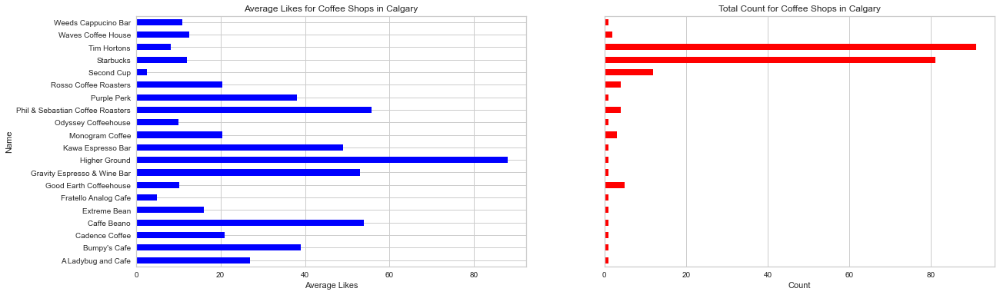

In [524]:
# Plotting the summary statistics for better visualization in bar plot 
# First Get the Data required for graphing 
dfcoffee_likes=dfcoffee_grp.iloc[0].transpose()
dfcoffee_count=dfcoffee_grp.iloc[5].transpose()

fig = plt.figure() # create figure

ax0 = fig.add_subplot(1, 2, 1) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(1, 2, 2) # add subplot 2 (1 row, 2 columns, second plot)

# Subplot 1: Bar plot
dfcoffee_likes.plot(kind='barh', color='blue', figsize=(20, 6), ax=ax0) # add to subplot 1
ax0.set_title('Average Likes for Coffee Shops in Calgary')
ax0.set_xlabel('Average Likes')
ax0.set_ylabel('Name')

# Subplot 2: Bar plot
dfcoffee_count.plot(kind='barh', color='red', figsize=(20, 6), ax=ax1) # add to subplot 1
ax1.set_title ('Total Count for Coffee Shops in Calgary')
ax1.set_xlabel('Count')
ax1.set_yticklabels([])
ax1.yaxis.set_visible(False)
ax1.set_ylabel('')

plt.show()

### K-Means Clustering Analysis on Coffee Venues in Calgary Neighborhood 

In [64]:
# From the unique ID scrape neighbourhood venues, then use K-means clustering to group the coffee venues into different clusters

coffeedf=coffee_df.drop_duplicates(subset=['Venue Id'])

coffeedf['Venue']=coffeedf['Venue'].replace({'Tim Hortons / Esso': 'Tim Hortons', 
                                                     'Second Cup Coffee Co.': 'Second Cup', 
                                                     'Rosso Coffee Roasters (Tuxedo)': 'Rosso Coffee Roasters',
                                                    'Starbucks Coffee Westmarket Square':'Starbucks',
                                                    'Starbucks Silverado':'Starbucks',
                                                    'Good Earth Coffeehouse & Bakery':'Good Earth Coffeehouse',
                                                    'Good Earth Cafes':'Good Earth Coffeehouse',
                                                    'Good Earth Cafe':'Good Earth Coffeehouse',
                                                    'Second Cup - Calgary Library':'Second Cup'})
coffeedf
#calgaryvenues.groupby('Name').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Acadia,50.968655,-114.055587,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,Coffee Shop
1,Acadia,50.968655,-114.055587,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954,Coffee Shop
2,Acadia,50.968655,-114.055587,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409,Coffee Shop
3,Acadia,50.968655,-114.055587,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547,Coffee Shop
4,Acadia,50.968655,-114.055587,4b4667fef964a520eb1f26e3,Starbucks - Southland Crossing,50.966314,-114.072908,Coffee Shop
...,...,...,...,...,...,...,...,...
585,Stonegate Landing,51.163521,-113.985042,59f78113002f4c24892a5bef,Tim Hortons,51.154765,-113.999833,Coffee Shop
609,Tuscany,51.125380,-114.244843,4b10345cf964a520456b23e3,Starbucks,51.124796,-114.248401,Coffee Shop
614,University Heights,51.070740,-114.137231,505cb630e4b0474d87f25d04,Starbucks,51.075199,-114.137260,Coffee Shop
636,Upper Mount Royal,51.029358,-114.086519,4dc800961f6ef43b8a524444,Good Earth Coffeehouse,51.041408,-114.081741,Coffee Shop


In [65]:
# User defined function to extract and process all coffee venues in calgary

def getNearbyCoffeeVenues(names, cids, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, cid, lat, lng in zip(names, cids, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            cid,
            lat, 
            lng, 
            v['venue']['id'],
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])    
    
    # The code below contains two for loops:the first loop iterates over venues_list and gives row wise value at each iteration in terms of value_list
    # second for loop which is inside this loop iterates over values in value_list which we get from the above for loop and gives the value in the list.
    # It can be written as:        for venue_list in venue_list:
                                        # for item in venue_list:
                                            # item
            
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Coffee Shop Name',
                             'Coffee Id',
                  'Coffee Latitude', 
                  'Coffee Longitude', 
                  'Venue Id',
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [66]:
# Running the user defined function and pulling all relevant venues 

Nearby_Venues=getNearbyCoffeeVenues(names=coffeedf['Venue'], cids=coffeedf['Venue Id'], latitudes=coffeedf['Venue Latitude'],
                                    longitudes=coffeedf['Venue Longitude'])

Starbucks
Second Cup
Tim Hortons
Tim Hortons
Starbucks - Southland Crossing
Starbucks
Tim Hortons
Tim Hortons
Tomoka Coffee
Monogram Coffee
Phil & Sebastian Coffee Roasters
Monogram Coffee
Starbucks
Starbucks
Second Cup
Tim Hortons
Tim Hortons
Starbucks
Starbucks
Tim Hortons
Starbucks
A Ladybug and Cafe
Good Earth Coffeehouse
Starbucks
Starbucks
Tim Hortons
Tim Hortons
Tim Hortons
Tim Hortons
Ten Ren Tea & Ginseng Shop
Starbucks
Weeds Cappucino Bar
Tim Hortons
Tim Hortons
Waves Coffee House
Caffe Beano
Kawa Espresso Bar
Starbucks
Good Earth Coffeehouse
Tim Hortons
Starbucks
Second Cup
Starbucks
Tim Hortons
Tim Hortons
Tim Hortons
Tim Hortons
Second Cup
Starbucks
Starbucks
Starbucks
Bumpy's Cafe
Phil & Sebastian Coffee Roasters
Phil & Sebastian Coffee Roasters
Cadence Coffee
Starbucks
Tim Hortons
Tim Hortons
Tim Hortons
Starbucks
Starbucks
Tim Hortons
Starbucks kiosk
Phil & Sebastian Coffee Roasters
Starbucks
Gravity Espresso & Wine Bar
Rosso Coffee Roasters
Starbucks
Starbucks
Tim Hort

In [68]:
# Checking the size of resulting dataframe

print(Nearby_Venues.shape)
Nearby_Venues.head()

(5228, 9)


,Coffee Shop Name,Coffee Id,Coffee Latitude,Coffee Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Starbucks,4b6753c0f964a52046482be3,50.971784,-114.070952,4bfaedb91134b713428a0fc9,My Yoga Calgary (MYC),50.971683,-114.069419,Yoga Studio
1,Starbucks,4b6753c0f964a52046482be3,50.971784,-114.070952,4bd38fe377b29c74ca339182,Bolsa Vietnamese,50.968895,-114.070252,Vietnamese Restaurant
2,Starbucks,4b6753c0f964a52046482be3,50.971784,-114.070952,4b0586e9f964a520b87422e3,Ranchman's Cookhouse & Dancehall,50.970635,-114.072523,Nightclub
3,Starbucks,4b6753c0f964a52046482be3,50.971784,-114.070952,514b9927e4b0b0046e4b2c54,Bulk Barn,50.970422,-114.070838,Candy Store
4,Starbucks,4b6753c0f964a52046482be3,50.971784,-114.070952,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,Coffee Shop


In [69]:
# Analyzing each neighbourhood 

# one hot encoding
calgary_onehot = pd.get_dummies(Nearby_Venues[['Venue Category']], prefix="", prefix_sep="")

# add coffee shop name and id column back to dataframe
calgary_onehot['Coffee Id'] = Nearby_Venues['Coffee Id'] 

# move neighborhood column to the first column
fixed_columns = [calgary_onehot.columns[-1]] + list(calgary_onehot.columns[:-1])
calgary_onehot = calgary_onehot[fixed_columns]

calgary_onehot.head()


,Coffee Id,Accessories Store,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Argentinian Restaurant,Art Gallery,...,Vietnamese Restaurant,Warehouse Store,Water Park,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,4b6753c0f964a52046482be3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,4b6753c0f964a52046482be3,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,4b6753c0f964a52046482be3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4b6753c0f964a52046482be3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4b6753c0f964a52046482be3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [168]:
# Group rows by neighbourhoods and taking the frequency of occurence for each category

calgary_grouped = calgary_onehot.groupby('Coffee Id').mean().reset_index()
calgary_grouped=calgary_grouped.drop(columns=['Coffee Shop'])
calgary_grouped

,Coffee Id,Accessories Store,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Argentinian Restaurant,Art Gallery,...,Vietnamese Restaurant,Warehouse Store,Water Park,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,4b0336a9f964a520954d22e3,0.000000,0.0,0.0,0.0,0.0,0.0,0.043478,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.043478,0.000000,0.0,0.000000,0.043478
1,4b0586e7f964a520ef7322e3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.050847,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
2,4b0586e8f964a5204b7422e3,0.000000,0.0,0.0,0.0,0.0,0.0,0.069767,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.023256,0.023256,0.0,0.000000,0.000000
3,4b0586e9f964a520857422e3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4,4b0586e9f964a520937422e3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.045455,0.0,0.000000,0.045455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,5be3dfa6de3bbf002c45025a,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
224,5be40812db1d81002c3b5969,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.031250,0.0,0.000000,0.000000
225,5be5b3eb3183940025c8e2cc,0.013158,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.026316,0.000000
226,5ceac21e1acf11002ce60cbe,0.000000,0.0,0.0,0.0,0.0,0.0,0.035714,0.0,0.0,...,0.035714,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000


In [169]:
# Writing Function to sort each venues in descending order 

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [474]:
# Creating new dataframe to display top 10 venues in each neighbourhood

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Coffee Id']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Coffee Id'] = calgary_grouped['Coffee Id']

for ind in np.arange(calgary_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(calgary_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Coffee Id,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4b0336a9f964a520954d22e3,Bakery,French Restaurant,Italian Restaurant,Café,Breakfast Spot,Pizza Place,German Restaurant,Grocery Store,River,Gym / Fitness Center
1,4b0586e7f964a520ef7322e3,Pizza Place,Pub,Mexican Restaurant,Grocery Store,Vietnamese Restaurant,Fast Food Restaurant,Liquor Store,Mediterranean Restaurant,Sandwich Place,Ice Cream Shop
2,4b0586e8f964a5204b7422e3,Café,American Restaurant,Burger Joint,Japanese Restaurant,Italian Restaurant,Pub,Sushi Restaurant,Gastropub,Tea Room,Korean Restaurant
3,4b0586e9f964a520857422e3,Café,Gourmet Shop,Thai Restaurant,Bar,Park,Liquor Store,Food Truck,Food Court,Filipino Restaurant,French Restaurant
4,4b0586e9f964a520937422e3,Asian Restaurant,Restaurant,Yoga Studio,Pizza Place,Boutique,Supermarket,Sandwich Place,Salon / Barbershop,Electronics Store,Grocery Store
...,...,...,...,...,...,...,...,...,...,...,...
223,5be3dfa6de3bbf002c45025a,Pub,Pet Store,Liquor Store,Grocery Store,Convenience Store,Fast Food Restaurant,Filipino Restaurant,Flea Market,Food,Food & Drink Shop
224,5be40812db1d81002c3b5969,Sandwich Place,Furniture / Home Store,Ice Cream Shop,Fast Food Restaurant,Sushi Restaurant,Shopping Mall,Electronics Store,Clothing Store,Tanning Salon,Restaurant
225,5be5b3eb3183940025c8e2cc,Clothing Store,Electronics Store,Fast Food Restaurant,Cosmetics Shop,Steakhouse,Bookstore,Sporting Goods Shop,Deli / Bodega,Women's Store,Italian Restaurant
226,5ceac21e1acf11002ce60cbe,Hotel,Liquor Store,Pizza Place,Japanese Restaurant,Burger Joint,Movie Theater,Gas Station,Gastropub,Sandwich Place,Salon / Barbershop


In [475]:
# Import and run K-means to create 5 clusters
!pip install scikit-learn

# import k-means from clustering stage
from sklearn.cluster import KMeans

# set number of clusters
kclusters = 11
calgary_grouped_clustering = calgary_grouped.drop('Coffee Id', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(calgary_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([ 2,  3,  3,  8,  3,  8,  3,  3,  0,  3,  3,  8,  3,  3,  3,  0,  3,
        8,  0,  3,  3,  0,  3,  0,  3,  0,  2,  3,  3,  0,  3,  3,  3,  3,
        3,  0,  3,  3,  3,  8,  2,  3,  3, 10,  3,  0,  0,  3,  9,  0,  3,
        1,  6,  7,  6,  3,  3,  3,  6,  9,  1,  3,  3,  3,  3,  3,  2,  6,
        8,  6,  3,  3,  3,  0,  3,  3,  0,  3,  3,  3,  5,  3,  6,  3,  0,
        6,  3,  9,  3,  6,  3,  8,  5,  3,  3, 10,  8,  3,  8,  0,  2,  0,
        3,  3,  3,  0,  0,  0,  6,  3,  3,  3,  3,  8,  3,  0,  0,  3,  3,
        3,  3,  3,  3,  3,  3, 10,  3,  3,  3,  3,  3, 10,  3,  0,  4,  0,
        8,  3, 10,  3,  3,  3,  3,  3,  3,  0,  3, 10,  0,  3,  3,  4,  3,
        8,  4,  3,  3, 10,  6,  3,  3,  3,  6,  3,  3,  3,  3,  6,  0,  8,
        3,  3,  1,  3,  0,  6,  6,  9,  4,  3,  5,  3,  6,  8,  0,  0,  2,
        8,  6,  8,  0,  3,  3,  1,  3,  3,  2,  0,  6,  3,  8, 10,  3,  3,
        3,  6,  1,  3,  1,  3,  3,  3,  6,  8,  3,  5,  1,  6,  6,  0,  6,
        8,  3,  8,  0,  0

In [476]:
!pip install yellowbrick
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs


In [477]:
# Creating a new dataframe that contains the labels as well as the top 10 venues for each neighbourhood in Calgary

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


In [478]:
calgary_merged = coffeedf.rename(columns={"Venue Id": "Coffee Id", "Venue":"Coffee Shop Name", 
                                          "Venue Latitude": "Latitude", "Venue Longitude":"Longitude"})
calgary_merged=calgary_merged.drop(columns=['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue Category'])

calgary_merged

,Coffee Id,Coffee Shop Name,Latitude,Longitude
0,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952
1,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954
2,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409
3,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547
4,4b4667fef964a520eb1f26e3,Starbucks - Southland Crossing,50.966314,-114.072908
...,...,...,...,...
585,59f78113002f4c24892a5bef,Tim Hortons,51.154765,-113.999833
609,4b10345cf964a520456b23e3,Starbucks,51.124796,-114.248401
614,505cb630e4b0474d87f25d04,Starbucks,51.075199,-114.137260
636,4dc800961f6ef43b8a524444,Good Earth Coffeehouse,51.041408,-114.081741


In [479]:
neighborhoods_venues_sorted

,Cluster Labels,Coffee Id,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,4b0336a9f964a520954d22e3,Bakery,French Restaurant,Italian Restaurant,Café,Breakfast Spot,Pizza Place,German Restaurant,Grocery Store,River,Gym / Fitness Center
1,3,4b0586e7f964a520ef7322e3,Pizza Place,Pub,Mexican Restaurant,Grocery Store,Vietnamese Restaurant,Fast Food Restaurant,Liquor Store,Mediterranean Restaurant,Sandwich Place,Ice Cream Shop
2,3,4b0586e8f964a5204b7422e3,Café,American Restaurant,Burger Joint,Japanese Restaurant,Italian Restaurant,Pub,Sushi Restaurant,Gastropub,Tea Room,Korean Restaurant
3,8,4b0586e9f964a520857422e3,Café,Gourmet Shop,Thai Restaurant,Bar,Park,Liquor Store,Food Truck,Food Court,Filipino Restaurant,French Restaurant
4,3,4b0586e9f964a520937422e3,Asian Restaurant,Restaurant,Yoga Studio,Pizza Place,Boutique,Supermarket,Sandwich Place,Salon / Barbershop,Electronics Store,Grocery Store
...,...,...,...,...,...,...,...,...,...,...,...,...
223,8,5be3dfa6de3bbf002c45025a,Pub,Pet Store,Liquor Store,Grocery Store,Convenience Store,Fast Food Restaurant,Filipino Restaurant,Flea Market,Food,Food & Drink Shop
224,0,5be40812db1d81002c3b5969,Sandwich Place,Furniture / Home Store,Ice Cream Shop,Fast Food Restaurant,Sushi Restaurant,Shopping Mall,Electronics Store,Clothing Store,Tanning Salon,Restaurant
225,0,5be5b3eb3183940025c8e2cc,Clothing Store,Electronics Store,Fast Food Restaurant,Cosmetics Shop,Steakhouse,Bookstore,Sporting Goods Shop,Deli / Bodega,Women's Store,Italian Restaurant
226,6,5ceac21e1acf11002ce60cbe,Hotel,Liquor Store,Pizza Place,Japanese Restaurant,Burger Joint,Movie Theater,Gas Station,Gastropub,Sandwich Place,Salon / Barbershop


In [480]:
# merge calgary_grouped with calgary_merged to add latitude/longitude for each coffee shop
calgary_merged = calgary_merged.join(neighborhoods_venues_sorted.set_index('Coffee Id'), on='Coffee Id')

calgary_merged=calgary_merged.dropna()
calgary_merged=calgary_merged.astype({'Cluster Labels': 'int32'})

calgary_merged

,Coffee Id,Coffee Shop Name,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4b6753c0f964a52046482be3,Starbucks,50.971784,-114.070952,3,Pub,Gas Station,Fast Food Restaurant,Yoga Studio,Nightclub,Fried Chicken Joint,Sports Bar,Seafood Restaurant,Bookstore,Candy Store
1,4c96606372dd224b58dcab91,Second Cup,50.965255,-114.073954,3,Sports Bar,Sushi Restaurant,Hotel,Sandwich Place,Fast Food Restaurant,Vietnamese Restaurant,Breakfast Spot,Hardware Store,Light Rail Station,Clothing Store
2,4f0235efa69d45461fd1c3d3,Tim Hortons,50.976603,-114.070409,3,Furniture / Home Store,Sandwich Place,Pizza Place,Italian Restaurant,Fast Food Restaurant,Nightclub,Grocery Store,Bakery,Shoe Store,Sports Bar
3,581535f6d67ca503863b709f,Tim Hortons,50.975025,-114.073547,3,Fast Food Restaurant,Nightclub,Pizza Place,Pub,Sandwich Place,Yoga Studio,Bakery,Italian Restaurant,Grocery Store,Medical Supply Store
4,4b4667fef964a520eb1f26e3,Starbucks - Southland Crossing,50.966314,-114.072908,3,Sports Bar,Pub,Sushi Restaurant,Sandwich Place,Gas Station,Vietnamese Restaurant,Breakfast Spot,Fast Food Restaurant,Auto Garage,Light Rail Station
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
585,59f78113002f4c24892a5bef,Tim Hortons,51.154765,-113.999833,6,Gas Station,American Restaurant,Sporting Goods Shop,Gym / Fitness Center,Hotel,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Farmers Market
609,4b10345cf964a520456b23e3,Starbucks,51.124796,-114.248401,8,Grocery Store,Park,Liquor Store,Gas Station,Convenience Store,Pharmacy,Pet Store,Bar,Sandwich Place,Falafel Restaurant
614,505cb630e4b0474d87f25d04,Starbucks,51.075199,-114.137260,6,Theater,Hotel,College Gym,Skating Rink,Food,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Flea Market,Yoga Studio
636,4dc800961f6ef43b8a524444,Good Earth Coffeehouse,51.041408,-114.081741,3,Restaurant,Bar,Grocery Store,Italian Restaurant,Pub,Nightclub,Middle Eastern Restaurant,Bank,Bakery,Pharmacy


In [481]:
calgaryvenuesdf=calgaryvenues.rename(columns={"Venue Id": "Coffee Id"})
calgaryvenuesdf=calgaryvenuesdf.drop(columns=['Latitude', 'Longitude'])
calgaryvenuesdf

,Coffee Id,Name,Likes,Rating,Photos,Tips,Price
0,4b6753c0f964a52046482be3,Starbucks,3,6.7,2,0,1
2,4c96606372dd224b58dcab91,Second Cup,1,6.4,4,0,1
4,4f0235efa69d45461fd1c3d3,Tim Hortons,2,6.4,0,0,1
6,581535f6d67ca503863b709f,Tim Hortons,4,6.1,1,2,1
10,4d418efdde17a0937b49026c,Starbucks,1,6.6,1,2,1
...,...,...,...,...,...,...,...
446,59f78113002f4c24892a5bef,Tim Hortons,1,6.3,5,1,1
448,4b10345cf964a520456b23e3,Starbucks,9,6.5,17,4,1
450,505cb630e4b0474d87f25d04,Starbucks,12,6.6,7,3,1
452,4dc800961f6ef43b8a524444,Good Earth Coffeehouse,5,6.1,6,1,1


In [482]:
calgary_merged_ratings=calgaryvenuesdf.join(calgary_merged.set_index('Coffee Id'), on='Coffee Id')
calgary_merged_ratings=calgary_merged_ratings.drop(columns=['Coffee Shop Name'])
calgary_merged_ratings

,Coffee Id,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4b6753c0f964a52046482be3,Starbucks,3,6.7,2,0,1,50.971784,-114.070952,3,Pub,Gas Station,Fast Food Restaurant,Yoga Studio,Nightclub,Fried Chicken Joint,Sports Bar,Seafood Restaurant,Bookstore,Candy Store
2,4c96606372dd224b58dcab91,Second Cup,1,6.4,4,0,1,50.965255,-114.073954,3,Sports Bar,Sushi Restaurant,Hotel,Sandwich Place,Fast Food Restaurant,Vietnamese Restaurant,Breakfast Spot,Hardware Store,Light Rail Station,Clothing Store
4,4f0235efa69d45461fd1c3d3,Tim Hortons,2,6.4,0,0,1,50.976603,-114.070409,3,Furniture / Home Store,Sandwich Place,Pizza Place,Italian Restaurant,Fast Food Restaurant,Nightclub,Grocery Store,Bakery,Shoe Store,Sports Bar
6,581535f6d67ca503863b709f,Tim Hortons,4,6.1,1,2,1,50.975025,-114.073547,3,Fast Food Restaurant,Nightclub,Pizza Place,Pub,Sandwich Place,Yoga Studio,Bakery,Italian Restaurant,Grocery Store,Medical Supply Store
10,4d418efdde17a0937b49026c,Starbucks,1,6.6,1,2,1,51.054228,-113.984965,3,Italian Restaurant,Fast Food Restaurant,Frozen Yogurt Shop,Gym / Fitness Center,Seafood Restaurant,Paper / Office Supplies Store,Restaurant,Arts & Crafts Store,Steakhouse,Convenience Store
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,59f78113002f4c24892a5bef,Tim Hortons,1,6.3,5,1,1,51.154765,-113.999833,6,Gas Station,American Restaurant,Sporting Goods Shop,Gym / Fitness Center,Hotel,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Farmers Market
448,4b10345cf964a520456b23e3,Starbucks,9,6.5,17,4,1,51.124796,-114.248401,8,Grocery Store,Park,Liquor Store,Gas Station,Convenience Store,Pharmacy,Pet Store,Bar,Sandwich Place,Falafel Restaurant
450,505cb630e4b0474d87f25d04,Starbucks,12,6.6,7,3,1,51.075199,-114.137260,6,Theater,Hotel,College Gym,Skating Rink,Food,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Flea Market,Yoga Studio
452,4dc800961f6ef43b8a524444,Good Earth Coffeehouse,5,6.1,6,1,1,51.041408,-114.081741,3,Restaurant,Bar,Grocery Store,Italian Restaurant,Pub,Nightclub,Middle Eastern Restaurant,Bank,Bakery,Pharmacy


In [483]:
# Summary Stats
clusterlabelsdf=calgary_merged_ratings.groupby(['Cluster Labels']).mean().reset_index()
clusterlabelsdf

,Cluster Labels,Likes,Rating,Photos,Tips,Price,Latitude,Longitude
0,0,10.514286,6.660000,8.914286,4.000000,1.028571,51.036563,-114.065569
1,1,7.714286,6.957143,3.571429,3.142857,1.000000,50.983594,-114.014900
2,2,35.857143,7.285714,26.285714,13.142857,1.285714,51.035995,-114.075168
3,3,12.813084,6.717757,12.532710,5.504673,1.056075,51.034716,-114.079412
4,4,10.666667,6.766667,2.333333,1.000000,1.000000,50.898725,-113.995088
5,5,13.666667,7.466667,7.000000,3.333333,1.333333,50.994252,-114.058234
6,6,10.681818,6.727273,8.681818,3.681818,1.000000,51.042617,-114.051472
7,7,7.000000,5.300000,19.000000,4.000000,1.000000,51.088460,-114.062795
8,8,7.833333,6.522222,8.000000,3.611111,1.055556,51.054285,-114.093752
9,9,9.250000,6.500000,8.000000,2.750000,1.000000,51.026268,-114.054928


In [531]:
clusterlabelsdf.sort_values(by='Rating', ascending=False)

,Cluster Labels,Likes,Rating,Photos,Tips,Price,Latitude,Longitude
5,5,13.666667,7.466667,7.000000,3.333333,1.333333,50.994252,-114.058234
2,2,35.857143,7.285714,26.285714,13.142857,1.285714,51.035995,-114.075168
1,1,7.714286,6.957143,3.571429,3.142857,1.000000,50.983594,-114.014900
4,4,10.666667,6.766667,2.333333,1.000000,1.000000,50.898725,-113.995088
6,6,10.681818,6.727273,8.681818,3.681818,1.000000,51.042617,-114.051472
3,3,12.813084,6.717757,12.532710,5.504673,1.056075,51.034716,-114.079412
0,0,10.514286,6.660000,8.914286,4.000000,1.028571,51.036563,-114.065569
8,8,7.833333,6.522222,8.000000,3.611111,1.055556,51.054285,-114.093752
9,9,9.250000,6.500000,8.000000,2.750000,1.000000,51.026268,-114.054928
10,10,7.857143,6.185714,5.000000,4.000000,1.000000,51.053325,-114.077733


### From the table above it could be seen:

Highest Rating: 5, 2 and 1 and Highest Average Price

Lowest Rating: 7, 10 and 9 

In [588]:
calcluster_df=calgary_grouped.drop('Coffee Id', 1)
calcluster_df.insert(0, 'ClusterLabels', kmeans.labels_)

In [589]:
calcluster_df

,ClusterLabels,Accessories Store,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Argentinian Restaurant,Art Gallery,...,Vietnamese Restaurant,Warehouse Store,Water Park,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,2,0.000000,0.0,0.0,0.0,0.0,0.0,0.043478,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.043478,0.000000,0.0,0.000000,0.043478
1,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.050847,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
2,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.069767,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.023256,0.023256,0.0,0.000000,0.000000
3,8,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.045455,0.0,0.000000,0.045455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,8,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
224,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.031250,0.0,0.000000,0.000000
225,0,0.013158,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.026316,0.000000
226,6,0.000000,0.0,0.0,0.0,0.0,0.0,0.035714,0.0,0.0,...,0.035714,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000


In [591]:
calcluster_df=calcluster_df.loc[:,~(calcluster_df==0).all()]
calcluster_df

,ClusterLabels,Accessories Store,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Argentinian Restaurant,Art Gallery,...,Vietnamese Restaurant,Warehouse Store,Water Park,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,2,0.000000,0.0,0.0,0.0,0.0,0.0,0.043478,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.043478,0.000000,0.0,0.000000,0.043478
1,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.050847,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
2,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.069767,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.023256,0.023256,0.0,0.000000,0.000000
3,8,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.045455,0.0,0.000000,0.045455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,8,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000
224,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.031250,0.0,0.000000,0.000000
225,0,0.013158,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.026316,0.000000
226,6,0.000000,0.0,0.0,0.0,0.0,0.0,0.035714,0.0,0.0,...,0.035714,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000


In [592]:

cluster_top_grp=calcluster_df.groupby('ClusterLabels').mean().T

cluster_top_grp.dropna()

ClusterLabels,0,1,2,3,4,5,6,7,8,9,10
Accessories Store,0.002965,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Airport,0.004082,0.0,0.000000,0.003746,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Airport Food Court,0.000000,0.0,0.000000,0.000762,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Airport Lounge,0.000000,0.0,0.000000,0.004870,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Airport Service,0.000000,0.0,0.000000,0.003453,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
Wine Bar,0.000000,0.0,0.018634,0.000964,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Wine Shop,0.002730,0.0,0.000000,0.003801,0.0,0.0,0.002179,0.0,0.0,0.0,0.0
Wings Joint,0.002096,0.0,0.000000,0.002962,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Women's Store,0.006938,0.0,0.000000,0.000595,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


#### Top 3 Highest Rated Coffee Shops Cluster Labels 

In [616]:
cluster_top_grp.sort_values(by=[5,2,1], ascending=False).head(5)

ClusterLabels,0,1,2,3,4,5,6,7,8,9,10
Restaurant,0.032441,0.042857,0.000000,0.020397,0.0,0.229167,0.040629,0.000000,0.042222,0.000000,0.000000
Park,0.000000,0.000000,0.018482,0.007101,0.0,0.083333,0.003482,0.000000,0.017698,0.083333,0.000000
Food & Drink Shop,0.000000,0.000000,0.000000,0.005139,0.0,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000
German Restaurant,0.000000,0.000000,0.018634,0.000000,0.0,0.062500,0.000000,0.000000,0.000000,0.000000,0.000000
Ice Cream Shop,0.015479,0.019048,0.000000,0.014675,0.0,0.062500,0.005528,0.142857,0.031111,0.000000,0.078125


In [631]:
cluster_top_3=cluster_top_grp.sort_values(by=[5,2,1], ascending=False).head(10).drop(columns=[0,3,4,6,7,8,9,10])
cluster_top_3

ClusterLabels,1,2,5
Restaurant,0.042857,0.000000,0.229167
Park,0.000000,0.018482,0.083333
Food & Drink Shop,0.000000,0.000000,0.083333
German Restaurant,0.000000,0.018634,0.062500
Ice Cream Shop,0.019048,0.000000,0.062500
Bank,0.000000,0.000000,0.062500
Farmers Market,0.000000,0.000000,0.062500
Vietnamese Restaurant,0.030952,0.000000,0.041667
Gym / Fitness Center,0.000000,0.018634,0.020833
Asian Restaurant,0.000000,0.000000,0.020833


In [633]:
cluster_top_3['Total'] = cluster_top_3.sum(axis=1)
cluster_top_3

ClusterLabels,1,2,5,Total
Restaurant,0.042857,0.000000,0.229167,0.272024
Park,0.000000,0.018482,0.083333,0.101815
Food & Drink Shop,0.000000,0.000000,0.083333,0.083333
German Restaurant,0.000000,0.018634,0.062500,0.081134
Ice Cream Shop,0.019048,0.000000,0.062500,0.081548
Bank,0.000000,0.000000,0.062500,0.062500
Farmers Market,0.000000,0.000000,0.062500,0.062500
Vietnamese Restaurant,0.030952,0.000000,0.041667,0.072619
Gym / Fitness Center,0.000000,0.018634,0.020833,0.039467
Asian Restaurant,0.000000,0.000000,0.020833,0.020833


#### Bottom 3 Lowest Rated Coffee Shops Cluster Labels 

In [617]:
cluster_top_grp.sort_values(by=[7, 10, 9], ascending=False).head(5)

ClusterLabels,0,1,2,3,4,5,6,7,8,9,10
Home Service,0.000000,0.000000,0.0,0.000000,0.0,0.0000,0.000000,0.428571,0.012500,0.000000,0.000000
Ice Cream Shop,0.015479,0.019048,0.0,0.014675,0.0,0.0625,0.005528,0.142857,0.031111,0.000000,0.078125
Construction & Landscaping,0.000000,0.023810,0.0,0.000000,0.0,0.0000,0.000000,0.142857,0.000000,0.062500,0.041667
Playground,0.000000,0.000000,0.0,0.000792,0.0,0.0000,0.000000,0.142857,0.005556,0.270833,0.000000
Sandwich Place,0.026323,0.000000,0.0,0.039495,0.0,0.0000,0.015311,0.000000,0.029550,0.000000,0.156658


In [632]:
cluster_bot_3=cluster_top_grp.sort_values(by=[7, 10, 9], ascending=False).head(10).drop(columns=[0,1,2,3,4,5,6,8])
cluster_bot_3

ClusterLabels,7,9,10
Home Service,0.428571,0.000000,0.000000
Ice Cream Shop,0.142857,0.000000,0.078125
Construction & Landscaping,0.142857,0.062500,0.041667
Playground,0.142857,0.270833,0.000000
Sandwich Place,0.000000,0.000000,0.156658
Concert Hall,0.000000,0.000000,0.063725
Fast Food Restaurant,0.000000,0.000000,0.052492
Lounge,0.000000,0.000000,0.042484
Convenience Store,0.000000,0.125000,0.031250
Pizza Place,0.000000,0.062500,0.031250


In [634]:
cluster_bot_3['Total'] = cluster_bot_3.sum(axis=1)
cluster_bot_3

ClusterLabels,7,9,10,Total
Home Service,0.428571,0.000000,0.000000,0.428571
Ice Cream Shop,0.142857,0.000000,0.078125,0.220982
Construction & Landscaping,0.142857,0.062500,0.041667,0.247024
Playground,0.142857,0.270833,0.000000,0.413690
Sandwich Place,0.000000,0.000000,0.156658,0.156658
Concert Hall,0.000000,0.000000,0.063725,0.063725
Fast Food Restaurant,0.000000,0.000000,0.052492,0.052492
Lounge,0.000000,0.000000,0.042484,0.042484
Convenience Store,0.000000,0.125000,0.031250,0.156250
Pizza Place,0.000000,0.062500,0.031250,0.093750


In [627]:
# Visualzing the Resulting Clusters

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)
#folium.TileLayer('cartodbpositron').add_to(map_clusters)
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]

colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(calgary_merged_ratings['Latitude'], calgary_merged_ratings['Longitude'], 
                                  calgary_merged_ratings['Name'], calgary_merged_ratings['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    #folium.TileLayer('cartodbpositron').add_to(calgary_geo_map)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [628]:
# Heat Map
from folium import plugins
from folium.plugins import HeatMap

map_clusters1 = folium.Map(location=[latitude, longitude], zoom_start=10.8)

folium.TileLayer('cartodbpositron').add_to(map_clusters1)

HeatMap(data=calgary_merged_ratings[['Latitude', 'Longitude']]).add_to(map_clusters1)

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(calgary_merged_ratings['Latitude'], calgary_merged_ratings['Longitude'], 
                                  calgary_merged_ratings['Name'], calgary_merged_ratings['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    #folium.TileLayer('cartodbpositron').add_to(calgary_geo_map)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters1)
       
map_clusters1

In [625]:
# Layering the calgary_geo_map with the cluster labels to see if any trend could be observed

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]

colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(calgary_merged_ratings['Latitude'], calgary_merged_ratings['Longitude'], 
                                  calgary_merged_ratings['Name'], calgary_merged_ratings['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters).add_to(calgary_geo_map)

# show map
calgary_geo_map

***After Visualizing, each cluster will also be examined to determined the discriminating venue categories that distinguish each cluster***

***Cluster 0***

In [489]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 0, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,Tim Hortons,8,6.8,7,6,1,51.056854,-113.982534,0,Fast Food Restaurant,Italian Restaurant,Gym,Restaurant,Breakfast Spot,Steakhouse,Seafood Restaurant,Chinese Restaurant,Sandwich Place,Gym / Fitness Center
32,Tim Hortons,1,6.3,1,0,1,51.038459,-113.910788,0,Vietnamese Restaurant,Asian Restaurant,Department Store,Burger Joint,Discount Store,Movie Theater,Big Box Store,Arts & Crafts Store,Food,Food & Drink Shop
46,Starbucks,0,6.6,0,0,1,51.033220,-114.212280,0,Cycle Studio,Gym,Indian Restaurant,Daycare,Fast Food Restaurant,Gaming Cafe,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
90,Tim Hortons,6,7.0,6,0,1,51.000699,-114.072358,0,Clothing Store,Electronics Store,Fast Food Restaurant,Italian Restaurant,Cosmetics Shop,Restaurant,Deli / Bodega,Lingerie Store,Sporting Goods Shop,Brazilian Restaurant
92,Tim Hortons,19,7.0,14,10,1,50.992530,-114.073311,0,Clothing Store,Burger Joint,Sushi Restaurant,Steakhouse,Cosmetics Shop,New American Restaurant,Bridal Shop,Gas Station,Bookstore,Sporting Goods Shop
94,Second Cup,5,6.7,6,4,1,50.997937,-114.073935,0,Clothing Store,Electronics Store,Fast Food Restaurant,Cosmetics Shop,Steakhouse,Bookstore,Sporting Goods Shop,Deli / Bodega,Women's Store,Italian Restaurant
96,Starbucks,0,6.7,3,0,1,50.997882,-114.074004,0,Clothing Store,Electronics Store,Fast Food Restaurant,Cosmetics Shop,Steakhouse,Bookstore,Sporting Goods Shop,Deli / Bodega,Women's Store,Italian Restaurant
98,Starbucks,31,6.6,35,8,1,50.999155,-114.073886,0,Clothing Store,Cosmetics Shop,Electronics Store,Restaurant,Deli / Bodega,Bookstore,Italian Restaurant,Fast Food Restaurant,Food Court,Steakhouse
100,Starbucks,23,6.6,21,8,1,50.997882,-114.074000,0,Clothing Store,Electronics Store,Fast Food Restaurant,Cosmetics Shop,Steakhouse,Bookstore,Sporting Goods Shop,Deli / Bodega,Women's Store,Italian Restaurant
108,Cadence Coffee,21,7.8,19,8,1,51.085704,-114.180547,0,Vietnamese Restaurant,Arts & Crafts Store,Bar,Convenience Store,Martial Arts School,Thai Restaurant,Restaurant,Fast Food Restaurant,Filipino Restaurant,Flea Market


***Cluster 1***

In [490]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 1, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
18,Monogram Coffee,30,8.9,14,9,1,51.010967,-114.100054,1,Dog Run,Greek Restaurant,Yoga Studio,Falafel Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
52,Tim Hortons,5,6.7,1,0,1,50.898238,-113.942128,1,Grocery Store,Dog Run,Ice Cream Shop,Sports Bar,Pub,Breakfast Spot,Vietnamese Restaurant,Shopping Mall,Supermarket,Sushi Restaurant
54,Tim Hortons,4,6.3,2,1,1,50.894690,-113.943886,1,Grocery Store,Pub,Vietnamese Restaurant,Clothing Store,Shopping Mall,Breakfast Spot,Supermarket,Sports Bar,Hockey Field,Event Space
232,Starbucks,3,6.7,0,1,1,51.168076,-114.040911,1,Locksmith,Bar,Construction & Landscaping,Grocery Store,Yoga Studio,Food Court,Flea Market,Food,Food & Drink Shop,Food Truck
328,Tim Hortons,7,7.3,3,1,1,51.110534,-114.078460,1,Grocery Store,Athletics & Sports,Yoga Studio,Farmers Market,Gaming Cafe,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck
338,Starbucks,0,6.7,0,0,1,50.897975,-113.941271,1,Grocery Store,Dog Run,Ice Cream Shop,Sports Bar,Pub,Breakfast Spot,Vietnamese Restaurant,Shopping Mall,Supermarket,Sushi Restaurant
372,Starbucks,5,6.1,5,10,1,50.904680,-114.057593,1,Restaurant,Grocery Store,Steakhouse,Pharmacy,Burger Joint,Food Court,Filipino Restaurant,Flea Market,Food,Food & Drink Shop


***Cluster 2***

In [491]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 2, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
66,Tim Hortons,23,5.6,16,10,1,51.069060,-114.128237,2,Pharmacy,Pub,Park,Steakhouse,Bakery,Event Space,Athletics & Sports,BBQ Joint,Pizza Place,Diner
106,Phil & Sebastian Coffee Roasters,50,8.0,35,17,2,51.032926,-114.071629,2,Bakery,French Restaurant,Italian Restaurant,Café,Breakfast Spot,Pizza Place,German Restaurant,Grocery Store,River,Gym / Fitness Center
126,Phil & Sebastian Coffee Roasters,74,9.3,36,10,1,51.047816,-114.050092,2,Hotel,BBQ Joint,Food Truck,Music Venue,Bakery,Café,Museum,Argentinian Restaurant,Island,Italian Restaurant
134,Starbucks,32,6.9,14,9,1,51.051345,-114.050694,2,Italian Restaurant,Bakery,Burger Joint,Café,Supermarket,Sushi Restaurant,Bar,BBQ Joint,Trail,Gas Station
208,Starbucks,16,6.5,3,6,1,50.985426,-114.082288,2,Pub,Pharmacy,Japanese Restaurant,Bakery,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Furniture / Home Store,Falafel Restaurant
264,Purple Perk,38,7.9,48,34,2,51.032799,-114.071519,2,Bakery,French Restaurant,Italian Restaurant,Café,Breakfast Spot,Pizza Place,German Restaurant,Grocery Store,River,Gym / Fitness Center
268,Starbucks,18,6.8,32,6,1,51.032590,-114.071720,2,Bakery,French Restaurant,Italian Restaurant,Café,Breakfast Spot,Pizza Place,German Restaurant,Grocery Store,River,Gym / Fitness Center


***Cluster 3***

In [492]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 3, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Starbucks,3,6.7,2,0,1,50.971784,-114.070952,3,Pub,Gas Station,Fast Food Restaurant,Yoga Studio,Nightclub,Fried Chicken Joint,Sports Bar,Seafood Restaurant,Bookstore,Candy Store
2,Second Cup,1,6.4,4,0,1,50.965255,-114.073954,3,Sports Bar,Sushi Restaurant,Hotel,Sandwich Place,Fast Food Restaurant,Vietnamese Restaurant,Breakfast Spot,Hardware Store,Light Rail Station,Clothing Store
4,Tim Hortons,2,6.4,0,0,1,50.976603,-114.070409,3,Furniture / Home Store,Sandwich Place,Pizza Place,Italian Restaurant,Fast Food Restaurant,Nightclub,Grocery Store,Bakery,Shoe Store,Sports Bar
6,Tim Hortons,4,6.1,1,2,1,50.975025,-114.073547,3,Fast Food Restaurant,Nightclub,Pizza Place,Pub,Sandwich Place,Yoga Studio,Bakery,Italian Restaurant,Grocery Store,Medical Supply Store
10,Starbucks,1,6.6,1,2,1,51.054228,-113.984965,3,Italian Restaurant,Fast Food Restaurant,Frozen Yogurt Shop,Gym / Fitness Center,Seafood Restaurant,Paper / Office Supplies Store,Restaurant,Arts & Crafts Store,Steakhouse,Convenience Store
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,Tim Hortons,10,7.4,6,1,1,51.152418,-114.210212,3,Burger Joint,Fast Food Restaurant,Discount Store,Gas Station,Music Store,Liquor Store,Greek Restaurant,Bank,Grocery Store,Restaurant
414,Second Cup,4,6.2,6,2,1,51.150589,-114.213410,3,Burger Joint,Fast Food Restaurant,Pharmacy,Japanese Restaurant,Gas Station,Liquor Store,Greek Restaurant,Bank,Grocery Store,Discount Store
428,Tim Hortons,13,6.7,2,8,1,50.954553,-113.999851,3,Ice Cream Shop,Peking Duck Restaurant,Pet Store,Gift Shop,Sandwich Place,Fast Food Restaurant,Vietnamese Restaurant,Tennis Court,Convenience Store,Pharmacy
430,Tim Hortons,16,7.7,10,3,1,51.016953,-114.173643,3,Fast Food Restaurant,Restaurant,Pizza Place,Hardware Store,Bank,New American Restaurant,Sandwich Place,Library,Sporting Goods Shop,Sushi Restaurant


***Cluster 4***

In [493]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 4, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
190,Tim Hortons,11,6.9,1,0,1,50.886063,-114.026358,4,Gas Station,Liquor Store,Pizza Place,Sushi Restaurant,Food Court,Filipino Restaurant,Flea Market,Food,Food & Drink Shop,French Restaurant
194,Tim Hortons,0,6.3,2,1,1,50.886110,-114.026485,4,Gas Station,Liquor Store,Pizza Place,Sushi Restaurant,Food Court,Filipino Restaurant,Flea Market,Food,Food & Drink Shop,French Restaurant
214,Tim Hortons,21,7.1,4,2,1,50.924001,-113.932422,4,Gas Station,Indian Restaurant,Falafel Restaurant,Gaming Cafe,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court


***Cluster 5***

In [494]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 5, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,Monogram Coffee,8,8.2,3,1,1,51.009791,-114.081600,5,Restaurant,Food & Drink Shop,Park,Bank,Ice Cream Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Falafel Restaurant
26,Starbucks,19,7.0,11,5,1,51.009921,-114.082675,5,Restaurant,Food & Drink Shop,Park,Bank,Ice Cream Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Falafel Restaurant
408,Starbucks,14,7.2,7,4,2,50.963043,-114.010428,5,Restaurant,Vietnamese Restaurant,Food & Drink Shop,Gym / Fitness Center,Park,Asian Restaurant,Discount Store,Mexican Restaurant,Office,Food Court


***Cluster 6***

In [495]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 6, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
48,Starbucks,0,6.7,0,1,1,50.880824,-113.958520,6,Hotel,Café,Japanese Restaurant,Burger Joint,Pharmacy,Gas Station,Gastropub,Sandwich Place,Salon / Barbershop,Liquor Store
50,Tim Hortons,2,6.6,1,0,1,50.879366,-113.959716,6,Hotel,Liquor Store,Pizza Place,Japanese Restaurant,Burger Joint,Movie Theater,Gas Station,Gastropub,Sandwich Place,Salon / Barbershop
104,Phil & Sebastian Coffee Roasters,20,8.2,9,10,1,51.045619,-114.063324,6,Hotel,Restaurant,Steakhouse,Performing Arts Venue,Hookah Bar,Theater,American Restaurant,Lounge,Shoe Store,Gay Bar
110,Starbucks,14,7.0,3,0,1,51.084660,-114.207520,6,Hotel,Fast Food Restaurant,Gas Station,American Restaurant,Bar,Sandwich Place,Breakfast Spot,Pizza Place,Dessert Shop,Deli / Bodega
132,Rosso Coffee Roasters,29,8.1,25,10,1,51.042080,-114.054203,6,Theater,Music Venue,Italian Restaurant,Liquor Store,BBQ Joint,Museum,Food,Asian Restaurant,Nightclub,Hockey Arena
136,Starbucks,19,7.4,7,4,1,51.048391,-114.063642,6,Hotel,Restaurant,Performing Arts Venue,American Restaurant,Steakhouse,Bar,Italian Restaurant,Shoe Store,Breakfast Spot,Market
138,Tim Hortons,5,6.6,6,0,1,51.046366,-114.061499,6,Hotel,Performing Arts Venue,Theater,Steakhouse,American Restaurant,Restaurant,Hookah Bar,New American Restaurant,Noodle House,Pub
140,Tim Hortons,5,6.3,14,0,1,51.047812,-114.056184,6,Hotel,Theater,Performing Arts Venue,Vietnamese Restaurant,Museum,Music Venue,BBQ Joint,Italian Restaurant,Bakery,Argentinian Restaurant
142,Tim Hortons,12,6.3,8,5,1,51.046600,-114.055949,6,Hotel,Theater,Performing Arts Venue,Restaurant,Museum,Music Venue,Bakery,BBQ Joint,Italian Restaurant,Trail
144,Second Cup,3,5.8,8,3,1,51.046481,-114.058141,6,Performing Arts Venue,Hotel,Restaurant,Theater,Vietnamese Restaurant,New American Restaurant,Music Venue,Museum,BBQ Joint,American Restaurant


***Cluster 7***

In [496]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 7, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
436,Tim Hortons,7,5.3,19,4,1,51.08846,-114.062795,7,Home Service,Playground,Construction & Landscaping,Ice Cream Shop,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,French Restaurant,Falafel Restaurant,Food Truck


***Cluster 8***

In [497]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 8, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
30,Tim Hortons,9,6.7,1,2,1,51.038402,-113.931031,8,Home Service,Convenience Store,Liquor Store,Frozen Yogurt Shop,Fried Chicken Joint,Furniture / Home Store,French Restaurant,Food Truck,Falafel Restaurant,Food Court
56,Tim Hortons,19,6.3,14,19,2,51.141690,-114.068422,8,Vietnamese Restaurant,Pharmacy,Sports Bar,Gas Station,Supermarket,Liquor Store,Sandwich Place,Middle Eastern Restaurant,Asian Restaurant,BBQ Joint
62,Weeds Cappucino Bar,11,6.0,12,14,1,51.070377,-114.104793,8,Café,Gourmet Shop,Thai Restaurant,Bar,Park,Liquor Store,Food Truck,Food Court,Filipino Restaurant,French Restaurant
74,Starbucks,1,6.3,3,1,1,51.031795,-114.095158,8,Pub,Pet Store,Liquor Store,Grocery Store,Convenience Store,Fast Food Restaurant,Filipino Restaurant,Flea Market,Food,Food & Drink Shop
84,Starbucks,1,6.4,4,0,1,51.127154,-114.073565,8,Liquor Store,Grocery Store,Pizza Place,Italian Restaurant,Bar,Bank,Chinese Restaurant,Fast Food Restaurant,Discount Store,Sandwich Place
86,Tim Hortons,4,6.5,3,0,1,51.125512,-114.069479,8,Liquor Store,Grocery Store,Hockey Arena,Bar,Bank,Sandwich Place,Fast Food Restaurant,Discount Store,Skating Rink,Italian Restaurant
218,Starbucks,14,7.5,10,4,1,51.060318,-114.212768,8,Grocery Store,Liquor Store,Ice Cream Shop,Tapas Restaurant,Pizza Place,Pharmacy,Italian Restaurant,Restaurant,Flea Market,Falafel Restaurant
220,Tim Hortons,11,6.7,10,2,1,51.059417,-114.212103,8,Grocery Store,Liquor Store,Ice Cream Shop,Tapas Restaurant,Pizza Place,Pharmacy,Italian Restaurant,Restaurant,Flea Market,Falafel Restaurant
222,Waves Coffee House,6,6.0,39,1,1,51.061338,-114.209207,8,Grocery Store,Liquor Store,Ice Cream Shop,Breakfast Spot,Pizza Place,Tapas Restaurant,Pharmacy,Italian Restaurant,Gourmet Shop,Restaurant
234,Good Earth Coffeehouse,9,8.1,2,5,1,50.879673,-113.976361,8,Pub,Pet Store,Liquor Store,Sandwich Place,Café,Sushi Restaurant,Grocery Store,Gas Station,Food & Drink Shop,Food Court


***Cluster 9***

In [498]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 9, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
38,Tim Hortons,10,5.9,19,4,1,51.141990,-114.182524,9,Playground,Pizza Place,Food Truck,Yoga Studio,Falafel Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Court
280,Tim Hortons,8,7.3,5,1,1,50.921034,-114.124061,9,Playground,Park,Yoga Studio,Falafel Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
356,Tim Hortons,11,6.4,3,5,1,50.917191,-113.980856,9,Playground,Convenience Store,Construction & Landscaping,Yoga Studio,Food Court,Fast Food Restaurant,Filipino Restaurant,Flea Market,Food,Food & Drink Shop
424,Tim Hortons,8,6.4,5,1,1,51.124858,-113.932273,9,Convenience Store,Residential Building (Apartment / Condo),Playground,Yoga Studio,Food & Drink Shop,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Flea Market,Food


***Cluster 10***

In [499]:
calgary_merged_ratings.loc[calgary_merged_ratings['Cluster Labels'] == 10, calgary_merged_ratings.columns[[1]+list(range(2, calgary_merged_ratings.shape[1]))]]

,Name,Likes,Rating,Photos,Tips,Price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
64,Tim Hortons,4,6.3,2,3,1,51.076911,-114.128144,10,Concert Hall,Lounge,Pub,Student Center,Hockey Arena,Gym / Fitness Center,Fast Food Restaurant,Noodle House,College Gym,Sandwich Place
88,Tim Hortons,2,6.4,1,0,1,51.132615,-114.099000,10,Ice Cream Shop,Pizza Place,Sandwich Place,Fabric Shop,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
198,Tim Hortons,2,6.4,6,0,1,51.078378,-114.131305,10,Concert Hall,Lounge,Pub,Student Center,Gym Pool,Fast Food Restaurant,College Gym,Sandwich Place,Skating Rink,Bus Line
202,Starbucks,11,5.5,11,8,1,51.077995,-114.131884,10,Concert Hall,Lounge,Pub,Student Center,Gym Pool,Fast Food Restaurant,College Gym,Sandwich Place,Skating Rink,Bus Line
262,Tim Hortons,4,6.1,5,1,1,50.956766,-113.961249,10,Construction & Landscaping,Sandwich Place,Yoga Studio,Falafel Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
282,Tim Hortons,16,6.6,3,3,1,50.993688,-113.957440,10,Fast Food Restaurant,Soccer Field,Ice Cream Shop,Sandwich Place,Mediterranean Restaurant,Chinese Restaurant,Food & Drink Shop,Filipino Restaurant,Flea Market,Food
400,Extreme Bean,16,6.0,7,13,1,51.056925,-114.135107,10,Ice Cream Shop,School,River,Chinese Restaurant,Sandwich Place,Hobby Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant
